## Figure 4B

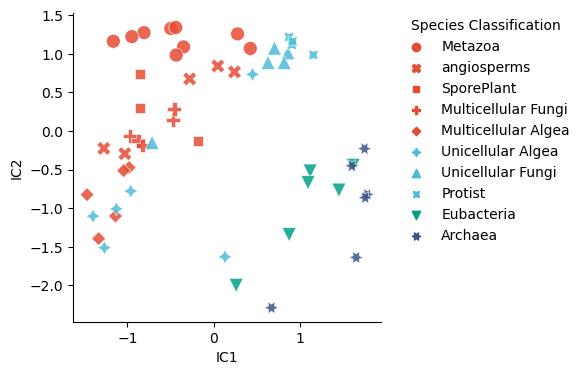

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import FastICA
from sklearn.preprocessing import StandardScaler
import pickle as pkl

with open('../RELIC_data/figure4B/species_word_frequency.pkl', 'rb') as f:
    data = pkl.load(f)

matrix_list = []
labels_list = []
known_types = [
    'Archaea', 'Eubacteria',
    'angiosperms', 'SporePlant', 'Multicellular_Algea',
    'Metazoa', 'Multicellular_Fungi',
    'Protist', 'Unicellular_Fungi', 'Unicellular_Algea'
]

for key, vector in data.items():
    if hasattr(vector, 'numpy'):
        vec = vector.numpy()
    else:
        vec = vector
    matrix_list.append(vec)

    found_type = 'Other'
    for t in known_types:
        if t in key:
            found_type = t
            break

    clean_label = found_type.replace('_', ' ')
    labels_list.append(clean_label)

X = np.array(matrix_list)

X_mean = np.mean(X, axis=1, keepdims=True)
X_std = np.std(X, axis=1, keepdims=True)
X = (X - X_mean) / (X_std + 1e-9)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

n_comp = 2
ica = FastICA(n_components=n_comp, max_iter=10000, whiten='unit-variance', random_state=42)
X_ica = ica.fit_transform(X_scaled)
A = ica.mixing_
raw_loads = np.sum(np.abs(A), axis=0)
sorted_indices = np.argsort(raw_loads)[::-1]
idx_1 = sorted_indices[0] 
idx_2 = sorted_indices[1] 
colors = {
    'Multi': '#E64B35',
    'Uni': '#4DBBD5',
    'Bact': '#00A087',
    'Arch': '#3C5488',
    'Other': 'gray'
}
raw_type_to_color_map = {
    'Metazoa': colors['Multi'], 'Multicellular_Fungi': colors['Multi'],
    'angiosperms': colors['Multi'], 'SporePlant': colors['Multi'], 'Multicellular_Algea': colors['Multi'],
    'Protist': colors['Uni'], 'Unicellular_Fungi': colors['Uni'], 'Unicellular_Algea': colors['Uni'],
    'Eubacteria': colors['Bact'],
    'Archaea': colors['Arch'],
    'Other': colors['Other']
}
type_to_color_map = {k.replace('_', ' '): v for k, v in raw_type_to_color_map.items()}
df_plot = pd.DataFrame({
    'Dim1': X_ica[:, idx_1],
    'Dim2': X_ica[:, idx_2],
    'Type': labels_list
})
fig, ax = plt.subplots(figsize=(6, 6)) 

scatter_kws = {'s': 100, 'alpha': 0.85, 'edgecolor': 'white', 'linewidth': 0.5}

sns.scatterplot(
    data=df_plot, x='Dim1', y='Dim2',
    hue='Type', style='Type', 
    palette=type_to_color_map, 
    ax=ax, **scatter_kws
)
ax.set_xlabel(f"IC1", fontsize=10)
ax.set_ylabel(f"IC2", fontsize=10)
sns.despine(top=True, right=True)

ax.set_box_aspect(1)
handles, labels = ax.get_legend_handles_labels()
ax.legend(
    handles, labels,
    title="Species Classification",
    bbox_to_anchor=(1.05, 1), loc='upper left',
    borderaxespad=0, frameon=False
)

plt.tight_layout()
plt.show()

## Figure 4C & S5C,D

loading: ../RELIC_data/figure4C/all_codes_idr_stats_with_variance.pkl ...


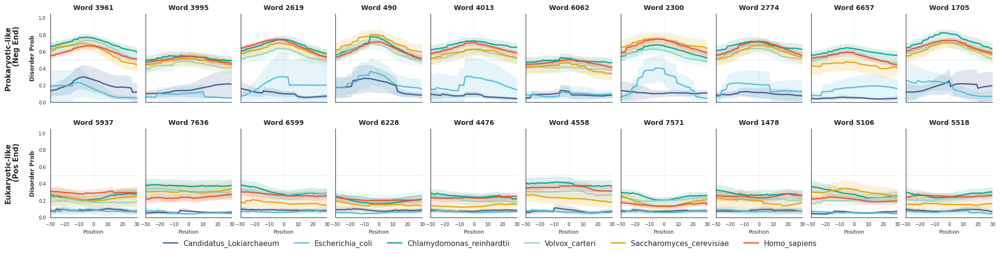

In [19]:
import pandas as pd
import matplotlib.pyplot as plt
import pickle
import numpy as np
import seaborn as sns

INPUT_FILE = "../RELIC_data/figure4C/all_codes_idr_stats_with_variance.pkl"

SELECTED_SPECIES = [
    'Candidatus_Lokiarchaeum',
    'Escherichia_coli',
    'Chlamydomonas_reinhardtii',
    'Volvox_carteri',
    'Saccharomyces_cerevisiae', 
    'Homo_sapiens'
]

SPECIES_COLORS = {
    'Candidatus_Lokiarchaeum':   '#3C5488',
    'Escherichia_coli':          '#4DBBD5',
    'Chlamydomonas_reinhardtii': '#00A087',
    'Volvox_carteri':            '#91D1C2',
    'Saccharomyces_cerevisiae':  '#E69F00',
    'Homo_sapiens':              '#E64B35',
}


NEG_INDICES = [3961, 3995, 2619, 490, 4013, 6062, 2300, 2774, 6657, 1705]
POS_INDICES = [5937, 7636, 6599, 6228, 4476, 4558, 7571, 1478, 5106, 5518]


print(f"loading: {INPUT_FILE} ...")
try:
    with open(INPUT_FILE, 'rb') as f:
        data_pkg = pickle.load(f)
except FileNotFoundError:
    print("File not found")
    exit()

df_prof = data_pkg["profile_df"]
radius = data_pkg["meta_info"]["radius"]

fig, axes = plt.subplots(2, 10, figsize=(22, 5.5), sharex=True, sharey=True)
axes = axes.flatten()

all_codes = NEG_INDICES + POS_INDICES
legend_handles = {} 

for i, code in enumerate(all_codes):
    ax = axes[i]
    code_df = df_prof[df_prof["Code"] == code]
    
    if code_df.empty:
        ax.axis('off')
        continue
    ax.axhline(0.5, color='gray', linestyle='--', linewidth=0.6, alpha=0.3)
    ax.axvline(0, color='gray', linestyle=':', linewidth=0.6, alpha=0.3)

    for sp in SELECTED_SPECIES:
        row = code_df[code_df["Species"] == sp]
        
        if row.empty:
            continue
            
        dat = row.iloc[0]
        mean = dat["Profile_Mean"]
        std = dat["Profile_Std"]
        n = dat["Count"]
        
        se = std / np.sqrt(n)
        ci_up = mean + 1.96 * se
        ci_lo = mean - 1.96 * se
        x = np.arange(-radius, radius + 1)
        
        c = SPECIES_COLORS.get(sp, 'gray')

        line, = ax.plot(x, mean, color=c, linewidth=2, alpha=0.9, label=sp)
        ax.fill_between(x, ci_lo, ci_up, color=c, alpha=0.15, edgecolor=None)
        
        legend_handles[sp] = line

    ax.set_title(f"Word {code}", fontsize=10, fontweight='bold')
    
    if i >= 10: ax.set_xlabel("Position", fontsize=8)
    if i % 10 == 0: 
        ax.set_ylabel("Disorder Prob", fontsize=9, fontweight='bold')
        label_text = "Prokaryotic-like\n(Neg End)" if i==0 else "Eukaryotic-like\n(Pos End)"
        ax.text(-0.35, 0.5, label_text, transform=ax.transAxes, 
                ha='right', va='center', fontsize=11, fontweight='bold', rotation=90)

    sns.despine(ax=ax)
    ax.tick_params(axis='both', labelsize=7)

plt.ylim(0, 1.05)
plt.xlim(-radius, radius)

valid_handles = []
valid_labels = []
for sp in SELECTED_SPECIES:
    if sp in legend_handles:
        valid_handles.append(legend_handles[sp])
        valid_labels.append(sp)

if len(valid_labels) > 0:
    fig.legend(valid_handles, valid_labels, 
               loc='lower center', bbox_to_anchor=(0.5, -0.02),
               ncol=len(valid_labels), frameon=False, fontsize=11)
else:
    print(f"No matching data: {SELECTED_SPECIES}")

plt.subplots_adjust(bottom=0.12, top=0.90, left=0.08, right=0.98, wspace=0.1, hspace=0.3)
plt.savefig("species_profiles_fixed.pdf", dpi=300, bbox_inches='tight')
plt.show()

[Step 1] Computing ICA...
[Step 2] Loading IDR data...
🎨 [Step 3] Drawing (Window Size=300)...


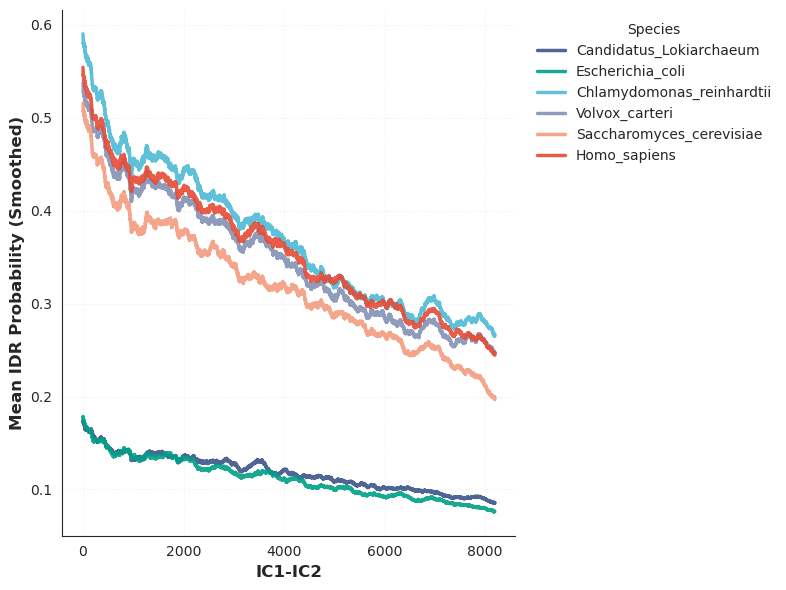

In [15]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import FastICA
from sklearn.preprocessing import StandardScaler
import pickle as pkl
from scipy.stats import pearsonr

IDR_DATA_PATH = "../RELIC_data/figure4C/all_codes_idr_stats_with_variance.pkl" 
VECTOR_DATA_PATH = '../RELIC_data/figure4B/species_word_frequency.pkl'

WINDOW_SIZE = 300 

TARGET_SPECIES_ORDER = [
    "Candidatus_Lokiarchaeum",
    "Escherichia_coli", 
    "Chlamydomonas_reinhardtii",
    "Volvox_carteri",
    "Saccharomyces_cerevisiae", 
    "Homo_sapiens"
]

SPECIES_COLORS = {
    "Candidatus_Lokiarchaeum": "#3C5488", 
    "Escherichia_coli": "#00A087",        
    "Chlamydomonas_reinhardtii": "#4DBBD5",
    "Volvox_carteri": "#8491B4",          
    "Saccharomyces_cerevisiae": "#F39B7F",
    "Homo_sapiens": "#E64B35"              
}

print("[Step 1] Computing ICA...")

with open(VECTOR_DATA_PATH, 'rb') as f:
    data = pkl.load(f)


matrix_list = []
for key, vector in data.items():
    vec = vector.numpy() if hasattr(vector, 'numpy') else vector
    matrix_list.append(vec)

X = np.array(matrix_list)
X_mean = np.mean(X, axis=1, keepdims=True)
X_std = np.std(X, axis=1, keepdims=True)
X = (X - X_mean) / (X_std + 1e-9)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

ica = FastICA(n_components=2, max_iter=10000, whiten='unit-variance', random_state=42)
ica.fit(X_scaled)
A = ica.mixing_

raw_loads = np.sum(np.abs(A), axis=0)
idx_1, idx_2 = np.argsort(raw_loads)[::-1][:2]
combined_vector = A[:, idx_1] - A[:, idx_2]

sorted_indices = np.argsort(combined_vector)
sorted_codes = np.arange(len(combined_vector))[sorted_indices]

print("[Step 2] Loading IDR data...")
try:
    with open(IDR_DATA_PATH, 'rb') as f:
        idr_pkg = pkl.load(f)
    df_stats = idr_pkg["stats_df"]
except FileNotFoundError:
    print("IDR file not found"); exit()

df_trend = pd.DataFrame({
    "Rank": range(len(sorted_codes)),
    "Code": sorted_codes
})

for sp in TARGET_SPECIES_ORDER:
    sp_data = df_stats[df_stats["Species"] == sp][["Code", "Mean_IDR"]]
    sp_data = sp_data.rename(columns={"Mean_IDR": f"IDR_{sp}"})
    df_trend = df_trend.merge(sp_data, on="Code", how="left")

print(f"🎨 [Step 3] Drawing (Window Size={WINDOW_SIZE})...")

fig, ax = plt.subplots(figsize=(8, 6))

x = df_trend["Rank"]

for sp in TARGET_SPECIES_ORDER:
    col_name = f"IDR_{sp}"
    color = SPECIES_COLORS.get(sp, 'gray')

    y_raw = df_trend[col_name]
    y_smooth = y_raw.rolling(window=WINDOW_SIZE, center=True, min_periods=1).mean()

    ax.plot(x, y_smooth, color=color, linewidth=2.5, label=sp, alpha=0.9)

ax.set_ylabel("Mean IDR Probability (Smoothed)", fontsize=12, fontweight='bold')
ax.set_xlabel("IC1-IC2", fontsize=12, fontweight='bold')
ax.legend(title="Species", bbox_to_anchor=(1.02, 1), loc='upper left', frameon=False)
sns.despine(ax=ax)
ax.grid(True, linestyle=':', alpha=0.3)
plt.tight_layout()
plt.show()

Loading Data ...
   -> Running FastICA (n=2)...
   -> ICA ranking
📂 [Step 2] Loading IDR data...
🎨 [Step 3] Drawing...


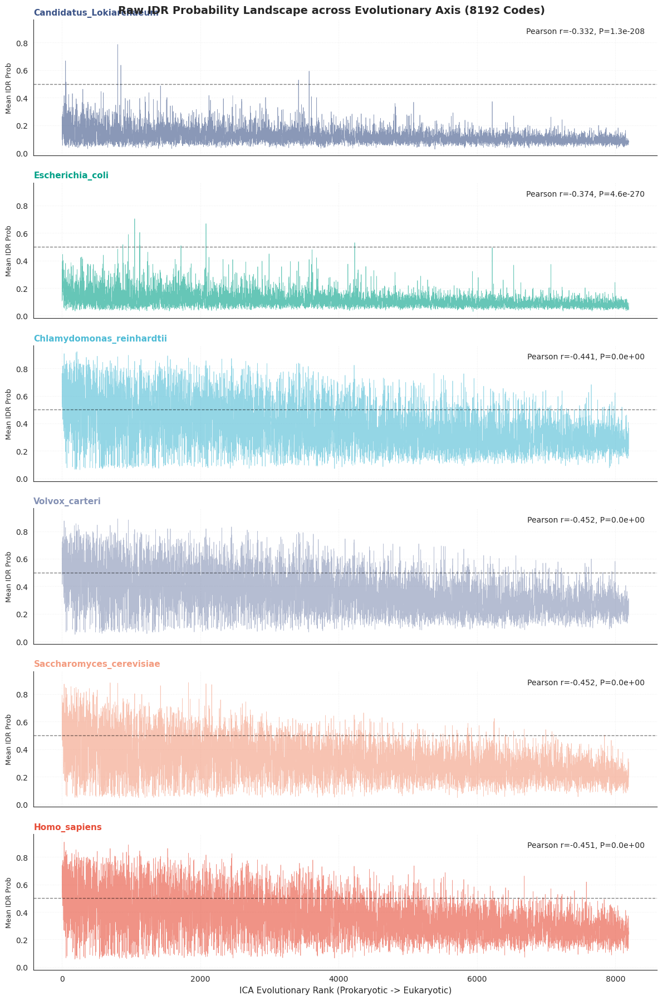

In [16]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import FastICA
from sklearn.preprocessing import StandardScaler
import pickle as pkl
from scipy.stats import pearsonr

IDR_DATA_PATH = "../data/all_codes_idr_stats_with_variance.pkl" 
VECTOR_DATA_PATH = '../data/species_word_frequency.pkl'

TARGET_SPECIES_ORDER = [
    "Candidatus_Lokiarchaeum",
    "Escherichia_coli",
    "Chlamydomonas_reinhardtii",
    "Volvox_carteri",
    "Saccharomyces_cerevisiae",
    "Homo_sapiens" 
]

SPECIES_COLORS = {
    "Candidatus_Lokiarchaeum": "#3C5488", 
    "Escherichia_coli": "#00A087",        
    "Chlamydomonas_reinhardtii": "#4DBBD5",
    "Volvox_carteri": "#8491B4",          
    "Saccharomyces_cerevisiae": "#F39B7F",
    "Homo_sapiens": "#E64B35"             
}

print("Loading Data ...")

try:
    with open(VECTOR_DATA_PATH, 'rb') as f:
        data = pkl.load(f)
except FileNotFoundError:
    print(f"File Not Found {VECTOR_DATA_PATH}")
    raise

matrix_list = []
for key, vector in data.items():
    vec = vector.numpy() if hasattr(vector, 'numpy') else vector
    matrix_list.append(vec)
X = np.array(matrix_list)
X_mean = np.mean(X, axis=1, keepdims=True)
X_std = np.std(X, axis=1, keepdims=True)
X = (X - X_mean) / (X_std + 1e-9)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
print("   -> Running FastICA (n=2)...")
ica = FastICA(n_components=2, max_iter=10000, whiten='unit-variance', random_state=42)
ica.fit(X_scaled)
A = ica.mixing_
raw_loads = np.sum(np.abs(A), axis=0)
sorted_comp_indices = np.argsort(raw_loads)[::-1]
idx_1, idx_2 = sorted_comp_indices[0], sorted_comp_indices[1]
w1 = A[:, idx_1]
w2 = A[:, idx_2]
combined_vector = w1 - w2 
sorted_indices = np.argsort(combined_vector)
sorted_codes = np.arange(len(combined_vector))[sorted_indices]
print(f"   -> ICA ranking")

print("📂 [Step 2] Loading IDR data...")

try:
    with open(IDR_DATA_PATH, 'rb') as f:
        idr_pkg = pkl.load(f)
    df_stats = idr_pkg["stats_df"]
except FileNotFoundError:
    print(f"File Not Found {IDR_DATA_PATH}")
    raise

df_trend = pd.DataFrame({
    "Rank": range(len(sorted_codes)),
    "Code": sorted_codes,
    "ICA_Score": combined_vector[sorted_indices]
})

for sp in TARGET_SPECIES_ORDER:
    sp_data = df_stats[df_stats["Species"] == sp][["Code", "Mean_IDR"]]
    sp_data = sp_data.rename(columns={"Mean_IDR": f"IDR_{sp}"})
    df_trend = df_trend.merge(sp_data, on="Code", how="left")
print("🎨 [Step 3] Drawing...")

fig, axes = plt.subplots(6, 1, figsize=(12, 18), sharex=True, sharey=True)
axes = axes.flatten()
x = df_trend["Rank"]
for i, sp in enumerate(TARGET_SPECIES_ORDER):
    ax = axes[i]
    col_name = f"IDR_{sp}"
    color = SPECIES_COLORS.get(sp, 'gray')
    y_raw = df_trend[col_name]
    valid_mask = y_raw.notna()
    if valid_mask.sum() > 200:
        r, p_val = pearsonr(df_trend.loc[valid_mask, "Rank"], y_raw[valid_mask])
        stats_text = f"Pearson r={r:.3f}, P={p_val:.1e}"
    else:
        stats_text = "N/A"
    ax.plot(x, y_raw, color=color, linewidth=0.5, alpha=0.6, label="Raw IDR Prob")
    ax.axhline(0.5, color='black', linestyle='--', linewidth=1, alpha=0.5)
    ax.set_ylabel("Mean IDR Prob", fontsize=9)
    ax.set_title(f"{sp}", loc='left', fontsize=11, fontweight='bold', color=color)
    ax.text(0.98, 0.9, stats_text, transform=ax.transAxes, ha='right', fontsize=10, 
            bbox=dict(facecolor='white', edgecolor='none', alpha=0.7))
    
    ax.grid(True, linestyle=':', alpha=0.3)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    if i == 5:
        ax.set_xlabel("ICA Evolutionary Rank (Prokaryotic -> Eukaryotic)", fontsize=11)

plt.tight_layout()
plt.subplots_adjust(hspace=0.2)
plt.suptitle(f"Raw IDR Probability Landscape across Evolutionary Axis (8192 Codes)", y=0.995, fontsize=14, fontweight='bold')

plt.show()

## Figure S4A-C

In [9]:
import pickle
import pandas as pd
from collections import defaultdict, Counter
from scipy.stats import hypergeom
PKL_PATH = '../RELIC_data/GO_annotation/go_enrichment_index.pkl'
print(f"loading ...")

with open(PKL_PATH, 'rb') as f:
    data_package = pickle.load(f)

go_meta = data_package['go_meta']
code_to_seq_indices = data_package['code_to_seq_indices']
seq_index_to_gos = data_package['seq_index_to_gos']
background_go_counts = data_package['background_go_counts']
total_sequences = data_package['total_sequences']

print("data loaded！")

loading ...
data loaded！


analysing words: [5937, 7636, 6599, 6228, 4476, 4558, 7571, 1478, 5106, 5518]
Found: 1425003 sequences (From: 17363704)
2788 GO Terms Enriched


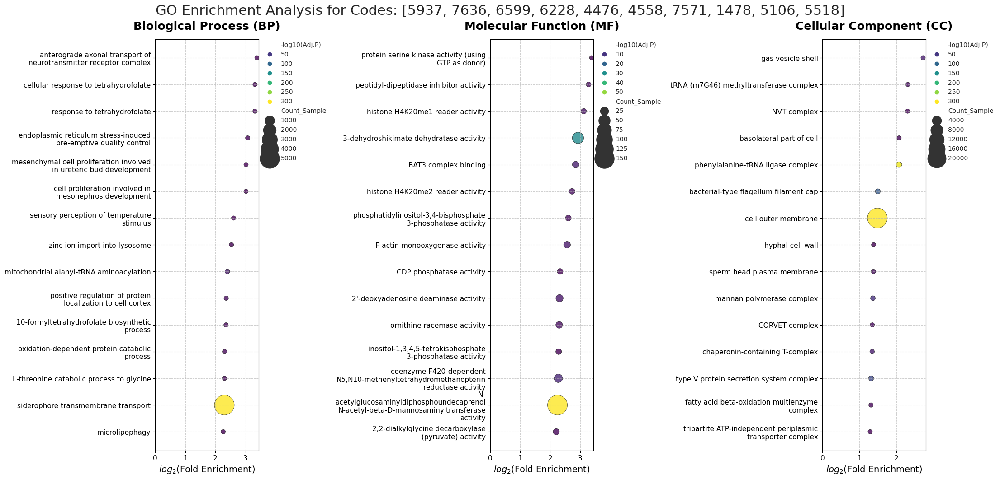

In [10]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import hypergeom
from collections import Counter
from statsmodels.stats.multitest import multipletests
import matplotlib.colors as mcolors
import textwrap

TARGET_CODES = pos_indices
P_VALUE_CUTOFF = 0.05              
TOP_K_PLOT = 15                    
BUBBLE_SIZE_RANGE = (50, 1000)      
MAX_TEXT_WIDTH = 40 

def analyze_enrichment_bubble_plot(target_codes):
    subset_indices_set = set()
    found_codes = []
    for code in target_codes:
        if code in code_to_seq_indices:
            subset_indices_set.update(code_to_seq_indices[code])
            found_codes.append(code)
            
    if not subset_indices_set:
        print(f"no seqeunce found with these words")
        return

    N = len(subset_indices_set) 
    M = total_sequences          
    
    print(f"analysing words: {found_codes}")
    print(f"Found: {N} sequences (From: {M})")
    
    subset_go_counts = Counter()
    for seq_idx in subset_indices_set:
        if seq_idx in seq_index_to_gos:
            subset_go_counts.update(seq_index_to_gos[seq_idx])

    results = []
    for go_idx, k in subset_go_counts.items():
        n = background_go_counts.get(go_idx, 0)
        p_value = hypergeom.sf(k - 1, M, n, N)
        meta = go_meta.get(go_idx, {'GO': f'Unknown_{go_idx}', 'name': 'Unknown', 'cat': 'Unknown'})
        
        fold_enrichment = (k / N) / (n / M) if n > 0 else 0
        
        results.append({
            'GO_ID': meta['GO'],
            'Term': meta['name'],
            'Category': meta['cat'],
            'Count_Sample': k,
            'Count_Bg': n,
            'Fold_Enrichment': fold_enrichment,
            'p_value': p_value
        })
        
    if not results:
        print("No GO annotation found")
        return

    df_res = pd.DataFrame(results)
    reject, pvals_corrected, _, _ = multipletests(df_res['p_value'], alpha=P_VALUE_CUTOFF, method='bonferroni')
    df_res['p_adj'] = pvals_corrected
    df_sig = df_res[df_res['p_adj'] < P_VALUE_CUTOFF].copy()
    df_sig['log2_FC'] = np.log2(df_sig['Fold_Enrichment'] + 1e-10)
    df_sig['-log10(Adj.P)'] = -np.log10(df_sig['p_adj'] + 1e-300)
    df_sig = df_sig.sort_values('log2_FC', ascending=False)
    
    print(f"{len(df_sig)} GO Terms Enriched")
    
    if len(df_sig) == 0:
        return
    
    categories = ['biological_process', 'molecular_function', 'cellular_component']
    titles = ['Biological Process (BP)', 'Molecular Function (MF)', 'Cellular Component (CC)']

    auto_height = max(6, TOP_K_PLOT * 0.7)

    fig, axes = plt.subplots(1, 3, figsize=(22, auto_height), constrained_layout=True)
    sns.set_style("whitegrid")

    for i, cat in enumerate(categories):
        ax = axes[i]
        df_cat = df_sig[df_sig['Category'] == cat].head(TOP_K_PLOT).copy()
        if len(df_cat) == 0:
            ax.text(0.5, 0.5, 'No Enriched Terms', ha='center', va='center', fontsize=14, color='gray')
            ax.set_title(titles[i], fontsize=16, fontweight='bold')
            ax.axis('off')
            continue
        df_cat['Wrapped_Term'] = df_cat['Term'].apply(lambda x: textwrap.fill(x, width=MAX_TEXT_WIDTH))
        sns.scatterplot(
            data=df_cat,
            x='log2_FC',
            y='Wrapped_Term',
            size='Count_Sample',
            hue='-log10(Adj.P)',
            sizes=BUBBLE_SIZE_RANGE,
            palette='viridis',
            edgecolor='black',
            linewidth=0.5,
            alpha=0.8,
            ax=ax
        )
        ax.set_xlim(left=0)
        ax.set_title(titles[i], fontsize=18, fontweight='bold', pad=15)
        ax.set_xlabel(r"$log_2(\text{Fold Enrichment})$", fontsize=14)
        ax.set_ylabel("") 

        ax.tick_params(axis='y', labelsize=11)
        ax.tick_params(axis='x', labelsize=11)

        ax.grid(True, linestyle='--', alpha=0.6)

        ax.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0, frameon=False)

    plt.suptitle(f"GO Enrichment Analysis for Codes: {found_codes}", fontsize=22)
    plt.show()
    
    return df_sig

df = analyze_enrichment_bubble_plot(TARGET_CODES)

analysing words: [3961, 3995, 2619, 490, 4013, 6062, 2300, 2774, 6657, 1705]
Found: 1314374 sequences (From: 17363704)
5791 GO Terms Enriched


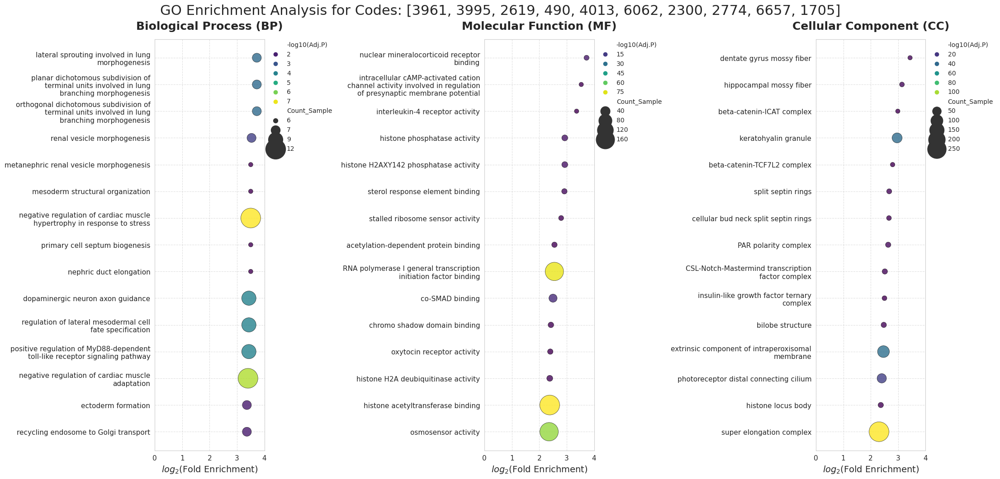

In [11]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import hypergeom
from collections import Counter
from statsmodels.stats.multitest import multipletests
import matplotlib.colors as mcolors
import textwrap

TARGET_CODES = neg_indices
P_VALUE_CUTOFF = 0.05              
TOP_K_PLOT = 15                    
BUBBLE_SIZE_RANGE = (50, 1000)      
MAX_TEXT_WIDTH = 40 

def analyze_enrichment_bubble_plot(target_codes):
    subset_indices_set = set()
    found_codes = []
    for code in target_codes:
        if code in code_to_seq_indices:
            subset_indices_set.update(code_to_seq_indices[code])
            found_codes.append(code)
            
    if not subset_indices_set:
        print(f"no seqeunce found with these words")
        return

    N = len(subset_indices_set) 
    M = total_sequences          
    
    print(f"analysing words: {found_codes}")
    print(f"Found: {N} sequences (From: {M})")
    
    subset_go_counts = Counter()
    for seq_idx in subset_indices_set:
        if seq_idx in seq_index_to_gos:
            subset_go_counts.update(seq_index_to_gos[seq_idx])

    results = []
    for go_idx, k in subset_go_counts.items():
        n = background_go_counts.get(go_idx, 0)
        p_value = hypergeom.sf(k - 1, M, n, N)
        meta = go_meta.get(go_idx, {'GO': f'Unknown_{go_idx}', 'name': 'Unknown', 'cat': 'Unknown'})
        
        fold_enrichment = (k / N) / (n / M) if n > 0 else 0
        
        results.append({
            'GO_ID': meta['GO'],
            'Term': meta['name'],
            'Category': meta['cat'],
            'Count_Sample': k,
            'Count_Bg': n,
            'Fold_Enrichment': fold_enrichment,
            'p_value': p_value
        })
        
    if not results:
        print("No GO annotation found")
        return

    df_res = pd.DataFrame(results)
    reject, pvals_corrected, _, _ = multipletests(df_res['p_value'], alpha=P_VALUE_CUTOFF, method='bonferroni')
    df_res['p_adj'] = pvals_corrected
    df_sig = df_res[df_res['p_adj'] < P_VALUE_CUTOFF].copy()
    df_sig['log2_FC'] = np.log2(df_sig['Fold_Enrichment'] + 1e-10)
    df_sig['-log10(Adj.P)'] = -np.log10(df_sig['p_adj'] + 1e-300)
    df_sig = df_sig.sort_values('log2_FC', ascending=False)
    
    print(f"{len(df_sig)} GO Terms Enriched")
    
    if len(df_sig) == 0:
        return
    
    categories = ['biological_process', 'molecular_function', 'cellular_component']
    titles = ['Biological Process (BP)', 'Molecular Function (MF)', 'Cellular Component (CC)']

    auto_height = max(6, TOP_K_PLOT * 0.7)

    fig, axes = plt.subplots(1, 3, figsize=(22, auto_height), constrained_layout=True)
    sns.set_style("whitegrid")

    for i, cat in enumerate(categories):
        ax = axes[i]
        df_cat = df_sig[df_sig['Category'] == cat].head(TOP_K_PLOT).copy()
        if len(df_cat) == 0:
            ax.text(0.5, 0.5, 'No Enriched Terms', ha='center', va='center', fontsize=14, color='gray')
            ax.set_title(titles[i], fontsize=16, fontweight='bold')
            ax.axis('off')
            continue
        df_cat['Wrapped_Term'] = df_cat['Term'].apply(lambda x: textwrap.fill(x, width=MAX_TEXT_WIDTH))
        sns.scatterplot(
            data=df_cat,
            x='log2_FC',
            y='Wrapped_Term',
            size='Count_Sample',
            hue='-log10(Adj.P)',
            sizes=BUBBLE_SIZE_RANGE,
            palette='viridis',
            edgecolor='black',
            linewidth=0.5,
            alpha=0.8,
            ax=ax
        )
        ax.set_xlim(0,4)
        ax.set_title(titles[i], fontsize=18, fontweight='bold', pad=15)
        ax.set_xlabel(r"$log_2(\text{Fold Enrichment})$", fontsize=14)
        ax.set_ylabel("") 

        ax.tick_params(axis='y', labelsize=11)
        ax.tick_params(axis='x', labelsize=11)

        ax.grid(True, linestyle='--', alpha=0.6)

        ax.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0, frameon=False)

    plt.suptitle(f"GO Enrichment Analysis for Codes: {found_codes}", fontsize=22)
    plt.savefig('FigS5A.pdf',dpi=330)
    plt.show()
    
    return df_sig

df = analyze_enrichment_bubble_plot(TARGET_CODES)

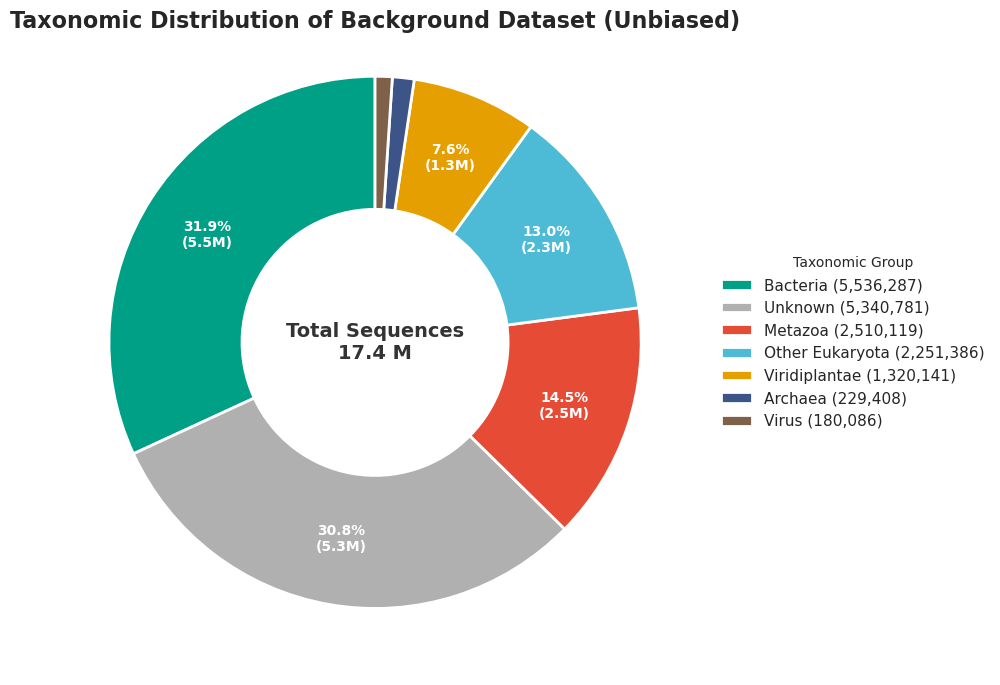

In [12]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

data = {
    "Taxonomy": [
        "Bacteria", 
        "Unknown", 
        "Metazoa", 
        "Other Eukaryota", 
        "Viridiplantae", 
        "Archaea", 
        "Virus"
    ],
    "Count": [
        5536287, 
        5340781, 
        2510119, 
        2251386, 
        1320141, 
        229408, 
        180086
    ]
}

df = pd.DataFrame(data)

df["Percentage"] = df["Count"] / df["Count"].sum() * 100

df = df.sort_values("Count", ascending=False)

COLOR_MAP = {
    "Archaea":          "#3C5488",
    "Bacteria":         "#00A087",
    "Metazoa":          "#E64B35",
    "Viridiplantae":    "#E69F00",
    "Other Eukaryota":  "#4DBBD5",
    "Virus":            "#7E6148",
    "Unknown":          "#B0B0B0"
}

colors = [COLOR_MAP[tax] for tax in df["Taxonomy"]]

plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['DejaVu Sans', 'Arial']

fig, ax = plt.subplots(figsize=(10, 7))

def make_autopct(values):
    def my_autopct(pct):
        total = sum(values)
        val = int(round(pct*total/100.0))
        if pct < 2.5:
            return ""
        return '{p:.1f}%\n({v:.1f}M)'.format(p=pct, v=val/1000000)
    return my_autopct

wedges, texts, autotexts = ax.pie(
    df["Count"], 
    labels=None,
    colors=colors,
    autopct=make_autopct(df["Count"]),
    startangle=90,
    pctdistance=0.75,
    wedgeprops=dict(width=0.5, edgecolor='white', linewidth=2)
)

for autotext in autotexts:
    autotext.set_color('white')
    autotext.set_fontsize(10)
    autotext.set_weight('bold')

total_count = df["Count"].sum() / 1000000
ax.text(0, 0, f"Total Sequences\n{total_count:.1f} M", 
        ha='center', va='center', fontsize=14, fontweight='bold', color='#333333')

legend_labels = [f"{tax} ({count:,})" for tax, count in zip(df["Taxonomy"], df["Count"])]

ax.legend(
    wedges, 
    legend_labels,
    title="Taxonomic Group",
    loc="center left",
    bbox_to_anchor=(1, 0, 0.5, 1),
    frameon=False,
    fontsize=11
)

plt.title("Taxonomic Distribution of Background Dataset (Unbiased)", fontsize=16, fontweight='bold', y=0.96)
plt.tight_layout()
plt.show()

## Figure S5A

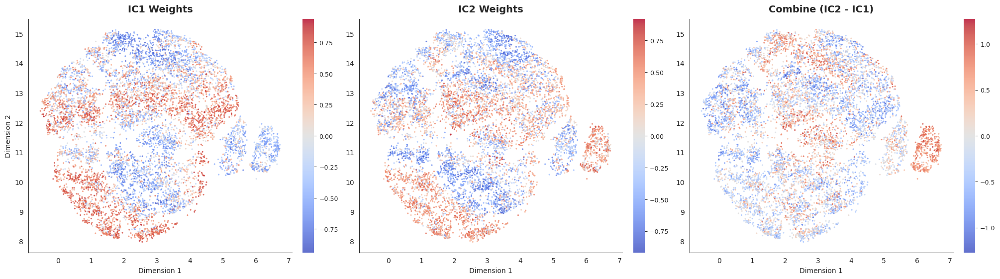

In [13]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

with open('../RELIC_data/figureS3/codebook_umap_embedding.pkl','rb') as f:
    embeddings = pkl.load(f)

sns.set_style("white")
w_diff = w2 - w1
plot_data = [
    {"data": w1,     "title": "IC1 Weights"},
    {"data": w2,     "title": "IC2 Weights"},
    {"data": w_diff, "title": "Combine (IC2 - IC1)"}
]

plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['DejaVu Sans', 'Arial']

fig, axes = plt.subplots(1, 3, figsize=(20, 5.5), constrained_layout=True)

SCATTER_SIZE = 5
ALPHA = 0.8

for i, ax in enumerate(axes):
    info = plot_data[i]
    values = info["data"]
    limit = np.max(np.abs(values))
    sc = ax.scatter(
        embeddings[:, 0],
        embeddings[:, 1],
        c=values,
        s=SCATTER_SIZE,
        alpha=ALPHA,
        cmap='coolwarm',
        vmin=-limit,
        vmax=limit,
        edgecolor='none'
    )

    ax.set_title(info["title"], fontsize=14, fontweight='bold', pad=10)
    ax.set_xlabel("Dimension 1", fontsize=10)

    if i == 0:
        ax.set_ylabel("Dimension 2", fontsize=10)

    sns.despine(ax=ax)

    cbar = plt.colorbar(sc, ax=ax, fraction=0.046, pad=0.04)
    cbar.outline.set_visible(False)
    cbar.ax.tick_params(labelsize=9)
plt.show()

Bottom 10 Indices (Blue): [5937 7636 6599 6228 4476 4558 7571 1478 5106 5518]
Top 10 Indices (Red): [1705 6657 2774 2300 6062 4013  490 2619 3995 3961]


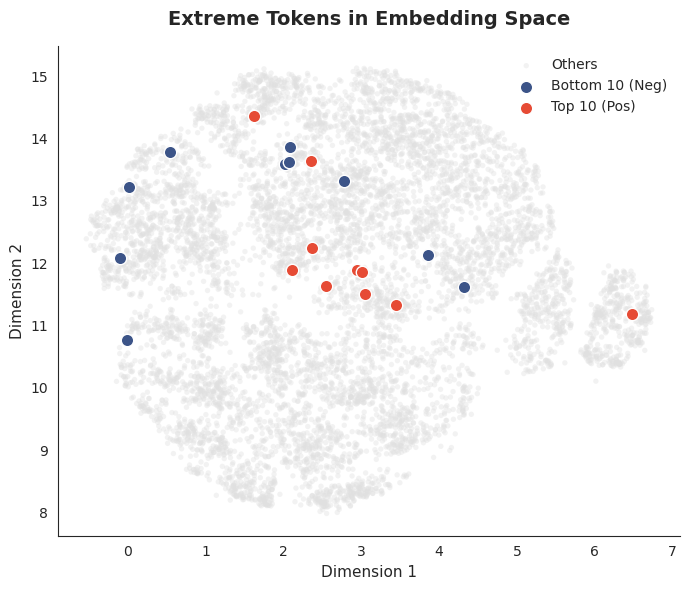

In [14]:
sorted_indices = np.argsort(w_diff)

neg_indices = sorted_indices[:10]

pos_indices = sorted_indices[-10:]

print(f"Bottom 10 Indices (Blue): {neg_indices}")
print(f"Top 10 Indices (Red): {pos_indices}")

fig, ax = plt.subplots(figsize=(7, 6))

ax.scatter(
    embeddings[:, 0], 
    embeddings[:, 1], 
    c='#E0E0E0',
    s=15,
    alpha=0.4,
    label='Others',
    zorder=1,
    edgecolor='none'
)

ax.scatter(
    embeddings[neg_indices, 0], 
    embeddings[neg_indices, 1], 
    c='#3C5488',
    s=80,
    alpha=1.0,
    edgecolor='white',
    linewidth=1.0,
    label='Bottom 10 (Neg)',
    zorder=2
)

ax.scatter(
    embeddings[pos_indices, 0], 
    embeddings[pos_indices, 1], 
    c='#E64B35',
    s=80,
    alpha=1.0,
    edgecolor='white',
    linewidth=1.0,
    label='Top 10 (Pos)',
    zorder=3
)

ax.set_title("Extreme Tokens in Embedding Space", fontsize=14, fontweight='bold', pad=15)
ax.set_xlabel("Dimension 1", fontsize=11)
ax.set_ylabel("Dimension 2", fontsize=11)

sns.despine(ax=ax)

ax.legend(frameon=False, loc='best', fontsize=10)

plt.tight_layout()
plt.show()

## Figure S5B

Negative End Indices (Prokaryotic-like): [3961 3995 2619  490 4013 6062 2300 2774 6657 1705]
Positive End Indices (Complex Eukaryotic-like): [5937 7636 6599 6228 4476 4558 7571 1478 5106 5518]
Ordering: (10 types): ['Archaea', 'Eubacteria', 'Multicellular Algea', 'Unicellular Algea', 'Protist', 'Unicellular Fungi', 'Multicellular Fungi', 'SporePlant', 'angiosperms', 'Metazoa']


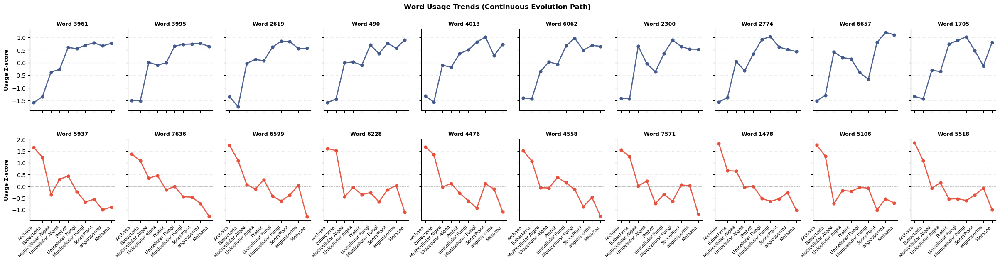

In [8]:
w1 = A[:, idx_1]
w2 = A[:, idx_2]
top_n = 10
combined_vector = w1 - w2 
sorted_indices = np.argsort(combined_vector)
neg_indices = sorted_indices[:top_n]
pos_indices = sorted_indices[-top_n:][::-1]
print(f"{'='*60}")
print(f"Negative End Indices (Prokaryotic-like): {neg_indices}")
print(f"Positive End Indices (Complex Eukaryotic-like): {pos_indices}")
print(f"{'='*60}")
full_bio_order = [
    'Archaea', 'Eubacteria', 
    'Multicellular Algea', 'Unicellular Algea',
    'Protist', 'Unicellular Fungi', 'Multicellular Fungi', 
    'SporePlant', 'angiosperms',
    'Metazoa'
]
existing_species = set(labels_list)
valid_bio_order = [s for s in full_bio_order if s in existing_species]
print(f"Ordering: ({len(valid_bio_order)} types): {valid_bio_order}")
df_features = pd.DataFrame(X_scaled)
df_features['Type'] = labels_list
df_grouped = df_features.groupby('Type').mean()
df_grouped = df_grouped.reindex(valid_bio_order)
n_rows = 2
n_cols = top_n
fig, axes = plt.subplots(n_rows, n_cols, figsize=(3 * n_cols, 6), sharex=True, sharey='row')
axes = axes.flatten()
plot_indices = np.concatenate([neg_indices, pos_indices])
colors_plot = ['#3C5488'] * top_n + ['#E64B35'] * top_n 
for i, token_idx in enumerate(plot_indices):
    ax = axes[i]
    y_data = df_grouped[token_idx]
    x_data = range(len(valid_bio_order))
    ax.plot(x_data, y_data, marker='o', markersize=5, 
            color=colors_plot[i], linewidth=2, alpha=0.9)
    ax.axhline(0, color='gray', linestyle='--', linewidth=0.8, alpha=0.4)
    ax.set_title(f"Word {token_idx}", fontweight='bold', fontsize=9)
    if i % n_cols == 0:
        ax.set_ylabel("Usage Z-score", fontsize=9, fontweight='bold')
    ax.set_xticks(x_data)
    if i >= top_n:
        ax.set_xticklabels(valid_bio_order, rotation=45, ha='right', fontsize=8)
    else:
        ax.tick_params(axis='x', which='both', labelbottom=False)
    sns.despine(ax=ax)
    ax.grid(axis='y', linestyle=':', alpha=0.3)
plt.subplots_adjust(wspace=0.15, hspace=0.35)
plt.suptitle(f"Word Usage Trends (Continuous Evolution Path)", 
             fontsize=12, fontweight='bold', y=0.98)
plt.show()

## Figure S3

 Plotting with Intra-Species Z-Score Normalization
   Color Scale: Z-score -2.0 (Blue) to 2.0 (Red)


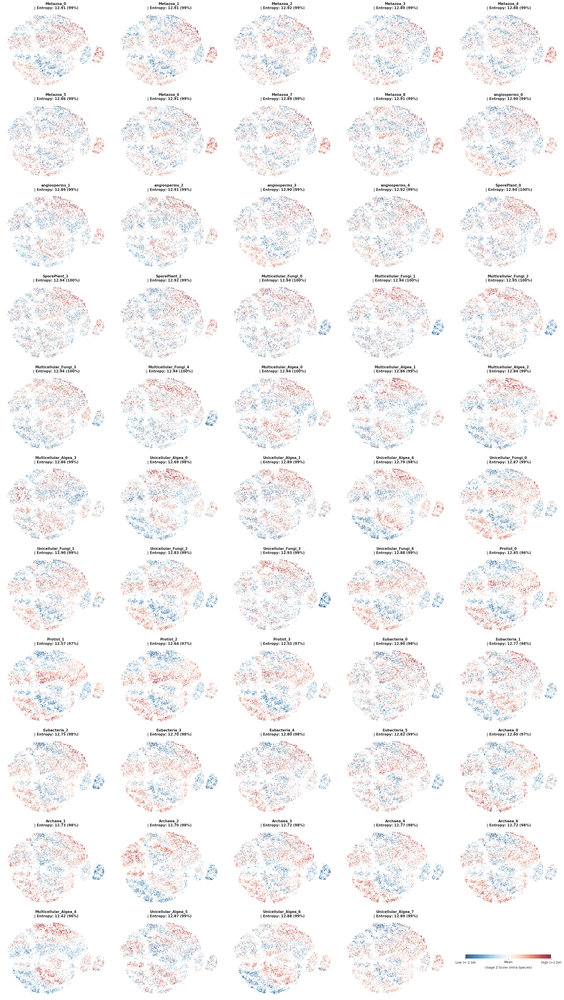

In [20]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import entropy
import pickle as pkl

POINT_SIZE = 3
ALPHA = 0.8
CMAP = 'RdBu_r'       # Z-Score 推荐用双色渐变 (蓝-白-红)
BG_COLOR = 'white'
LAYOUT_COLS = 5

VMIN_Z = -2.0
VMAX_Z = 2.0
VECTOR_DATA_PATH = '../RELIC_data/figure4B/species_word_frequency.pkl'
with open(VECTOR_DATA_PATH,'rb') as f:
    species_vectors = pkl.load(f)

with open('../RELIC_data/figureS3/codebook_umap_embedding.pkl','rb') as f:
    embedding = pkl.load(f)

namedict={
'Methanocaldococcus_jannaschii':  'Archaea_0',
'Thermococcus_kodakarensis':  'Archaea_1',
'Haloferax_volcanii':  'Archaea_2',
'Sulfolobus_acidocaldarius':  'Archaea_3',
'Nitrosopumilus_maritimus':  'Archaea_4',
'Candidatus_Lokiarchaeum':  'Archaea_6',
'Escherichia_coli':  'Eubacteria_0',
'Pseudomonas_aeruginosa':  'Eubacteria_1',
'Bacillus_subtilis':  'Eubacteria_2',
'Staphylococcus_aureus':  'Eubacteria_3',
'Prochlorococcus_marinus':  'Eubacteria_4',
'Microcystis_aeruginosa':  'Eubacteria_5',
'Amphimedon_queenslandica':  'Metazoa_0',
'Caenorhabditis_elegans':  'Metazoa_1',
'Drosophila_melanogaster':  'Metazoa_2',
'Danio_rerio':  'Metazoa_3',
'Xenopus_tropicalis':  'Metazoa_4',
'Anolis_carolinensis':  'Metazoa_5',
'Chrysemys_picta':  'Metazoa_6',
'Mus_musculus':  'Metazoa_7',
'Homo_sapiens':  'Metazoa_8',
'Chondrus_crispus':  'Multicellular_Algea_0',
'Ectocarpus_siliculosus':  'Multicellular_Algea_1',
'Volvox_carteri':  'Multicellular_Algea_2',
'Chara_braunii':  'Multicellular_Algea_3',
'Porphyra_umbilicalis':  'Multicellular_Algea_4',
'Agaricus_bisporus':  'Multicellular_Fungi_0',
'Neurospora_crassa':  'Multicellular_Fungi_1',
'Coprinopsis_cinerea':  'Multicellular_Fungi_2',
'Aspergillus_niger':  'Multicellular_Fungi_3',
'Lentinula_edodes':  'Multicellular_Fungi_4',
'Plasmodium_berghei':  'Protist_0',
'Tetrahymena_thermophila':  'Protist_1',
'Paramecium_tetraurelia':  'Protist_2',
'Dictyostelium_discoideum':  'Protist_3',
'Physcomitrium_patens':  'SporePlant_0',
'Marchantia_polymorpha':  'SporePlant_1',
'Selaginella_moellendorffii':  'SporePlant_2',
'Chlamydomonas_reinhardtii':  'Unicellular_Algea_0',
'Nannochloropsis_gaditana':  'Unicellular_Algea_1',
'Emiliania_huxleyi':  'Unicellular_Algea_4',
'Ostreococcus_lucimarinus':  'Unicellular_Algea_5',
'Cyanidioschyzon_merolae':  'Unicellular_Algea_6',
'Galdieria_sulphuraria':  'Unicellular_Algea_7',
'Saccharomyces_cerevisiae':  'Unicellular_Fungi_0',
'Schizosaccharomyces_pombe':  'Unicellular_Fungi_1',
'Candida_albicans':  'Unicellular_Fungi_2',
'Cryptococcus_neoformans':  'Unicellular_Fungi_3',
'Komagataella_phaffii':  'Unicellular_Fungi_4',
'Arabidopsis_thaliana':  'angiosperms_0',
'Oryza_sativa':  'angiosperms_1',
'Zea_mays':  'angiosperms_2',
'Populus_trichocarpa':  'angiosperms_3',
'Amborella_trichopoda':  'angiosperms_4'
}

if 'species_vectors' not in locals() or 'embedding' not in locals():
    raise ValueError("⚠️ Data not found! Please run the analysis cell first.")

names = list(species_vectors.keys())
rows = (len(names) + LAYOUT_COLS - 1) // LAYOUT_COLS

print(f" Plotting with Intra-Species Z-Score Normalization")
print(f"   Color Scale: Z-score {VMIN_Z} (Blue) to {VMAX_Z} (Red)")

fig, axes = plt.subplots(rows, LAYOUT_COLS, figsize=(5 * LAYOUT_COLS, 4 * rows))
axes = axes.flatten()

sc = None

for i, name in enumerate(names):
    ax = axes[i]
    raw_log_counts = species_vectors[name]
    safe_log = raw_log_counts - np.max(raw_log_counts)
    probs = np.exp(safe_log)
    probs = probs / np.sum(probs)
    ent = entropy(probs, base=2)
    max_ent = np.log2(len(raw_log_counts))
    norm_ent = ent / max_ent

    mu = np.mean(raw_log_counts)
    sigma = np.std(raw_log_counts) + 1e-8
    
    z_scores = (raw_log_counts - mu) / sigma
    
    # --- C. Plot ---
    sc = ax.scatter(
        embedding[:, 0], embedding[:, 1], 
        c=z_scores, 
        cmap=CMAP, 
        s=POINT_SIZE, 
        alpha=ALPHA,
        vmin=VMIN_Z, vmax=VMAX_Z,
        edgecolors='none' 
    )

    ax.set_facecolor(BG_COLOR)
    count_str = f"N={len(species_data[name])}" if 'species_data' in locals() else ""

    ax.set_title(f"{name}\n{count_str} | Entropy: {ent:.2f} ({norm_ent:.0%})", 
                 fontsize=11, fontweight='bold')
    
    ax.set_xticks([])
    ax.set_yticks([])
    for spine in ax.spines.values(): spine.set_visible(False)

for j in range(i + 1, len(axes)): axes[j].axis('off')

cbar_ax_idx = len(axes) - 1
if cbar_ax_idx > i: 
    cax = axes[cbar_ax_idx].inset_axes([0.1, 0.5, 0.8, 0.05])
else: 
    cax = fig.add_axes([0.92, 0.3, 0.015, 0.4])

cbar = fig.colorbar(sc, cax=cax, orientation='horizontal' if cbar_ax_idx > i else 'vertical')
cbar.set_label('Usage Z-Score (Intra-Species)', fontsize=10)
cbar.set_ticks([VMIN_Z, 0, VMAX_Z])
cbar.set_ticklabels([f'Low (<{VMIN_Z}$\sigma$)', 'Mean', f'High (>{VMAX_Z}$\sigma$)'])
cbar.outline.set_visible(False)

plt.tight_layout()
plt.subplots_adjust(right=0.9) if cbar_ax_idx <= i else None 
plt.show()